# **A Brief Explanation**

* **Plant Diseases Detection?**

  - The detection of plant diseases plays a pivotal role in modern agriculture, and its importance can be understood on multiple fronts:

    **Boosting Crop Health:** Early detection allows farmers to act promptly, preventing the spread of infections and ensuring vibrant, healthy crops.

    **Economic Sustainability:** By minimizing losses and preserving yield, it directly supports the livelihoods of farmers and strengthens the agricultural economy.

    **Securing Global Food Supply:** In a world facing rapid population growth, safeguarding crops from diseases is vital to ensuring consistent and reliable food production.

    **Environmental *italicized text* Stewardship:** Smart disease management means fewer chemical interventions, promoting sustainable farming and protecting ecosystems.

</div>


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


* **Why Pytorch and CNN?**

  - PyTorch and Convolutional Neural Networks (CNNs) are particularly well-suited for plant disease detection for several reasons:

    **Ease of Use:** PyTorch provides a flexible platform for deep learning research and development, which is user-friendly for both beginners and experts.
    
    **Dynamic Computation Graphs:** PyTorch allows for dynamic computation graphs that are essential for variable-length inputs and outputs, which is common in image-based tasks.
    
    **Effective Feature Extraction:** CNNs are powerful in extracting hierarchical features from images, which is crucial for identifying patterns indicative of plant diseases.
    
    **Advancements in Deep Learning:** Deep learning, particularly CNNs, has made significant breakthroughs in digital image processing, outperforming traditional methods in accuracy and efficiency.

    
    

# Upload your Kaggle API token (kaggle.json) from your local computer.
## This will be used to authenticate and download the dataset from Kaggle.

In [1]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"abdulrahmanh524","key":"4e36e7c7e200076895632ff4f42b4284"}'}

# Create Kaggle directory and move the API token to the correct location.
# Also, change the file permission to secure access by Kaggle CLI.

In [2]:
import os
import zipfile

os.makedirs("/root/.kaggle", exist_ok=True)

!mv kaggle.json /root/.kaggle/

!chmod 600 /root/.kaggle/kaggle.json


# Download the plant disease dataset from Kaggle using the API.
# Make sure your API key is correctly configured before running this.

In [3]:
!kaggle datasets download -d vipoooool/new-plant-diseases-dataset

Dataset URL: https://www.kaggle.com/datasets/vipoooool/new-plant-diseases-dataset
License(s): copyright-authors
100% 2.69G/2.70G [00:23<00:00, 66.2MB/s]
100% 2.70G/2.70G [00:23<00:00, 122MB/s] 


## Unzip the downloaded dataset into the /content/dataset directory.

In [4]:
!unzip -q new-plant-diseases-dataset.zip -d /content/dataset

##Install the colorama library to enable colored text output in the console.

In [5]:
!pip install colorama

## Import required libraries for data processing, visualization, and model training.
## Suppress warnings and load essential packages from PyTorch, torchvision, and utility libraries.

In [6]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torch.nn.functional as F
import colorama
from colorama import Fore, Style

##Define dataset paths for training, validation, and testing.
## Retrieve the list of disease classes available in the training directory.

In [7]:
Root_dir = "/content/dataset/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"
train_dir = Root_dir + "/train"
valid_dir = Root_dir + "/valid"
test_dir = "/content/dataset/test"
Diseases_classes = os.listdir(train_dir)

# Print all disease classes in green and show the total number of classes.

In [8]:
print(Fore.GREEN +str(Diseases_classes))
print("\nTotal number of classes are: ", len(Diseases_classes))

['Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Grape___healthy', 'Pepper,_bell___Bacterial_spot', 'Cherry_(including_sour)___healthy', 'Tomato___Septoria_leaf_spot', 'Apple___Black_rot', 'Peach___healthy', 'Tomato___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Tomato___Late_blight', 'Squash___Powdery_mildew', 'Potato___Early_blight', 'Corn_(maize)___Northern_Leaf_Blight', 'Corn_(maize)___Common_rust_', 'Soybean___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Apple___healthy', 'Pepper,_bell___healthy', 'Tomato___Leaf_Mold', 'Blueberry___healthy', 'Potato___healthy', 'Tomato___Target_Spot', 'Apple___Cedar_apple_rust', 'Tomato___Early_blight', 'Tomato___Bacterial_spot', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Apple___Apple_scab', 'Grape___Black_rot', 'Raspberry___healthy', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Strawberry___healthy', 'Potato___Late_blight', 'Peach___Bacterial_

# Visualize sample images from each plant disease class in a grid layout.
# Count and display the number of images per class and the total number of images.

In [9]:
plt.figure(figsize=(60,60), dpi=200)
cnt = 0
plant_names = []
tot_images = 0

for i in Diseases_classes:
    cnt += 1
    plant_names.append(i)
    plt.subplot(7, 7, cnt)

    image_path = os.listdir(train_dir + "/" + i)
    print(Fore.GREEN)
    print("The Number of Images in " + i + ":", len(image_path), end=" ")
    tot_images += len(image_path)

    img_show = plt.imread(train_dir + "/" + i + "/" + image_path[0])
    plt.imshow(img_show)
    plt.xlabel(i, fontsize=30)
    plt.xticks([])
    plt.yticks([])

print("\nTotal Number of Images in Directory:", tot_images)


The Number of Images in Tomato___Tomato_Yellow_Leaf_Curl_Virus: 1961 
The Number of Images in Grape___healthy: 1692 
The Number of Images in Pepper,_bell___Bacterial_spot: 1913 
The Number of Images in Cherry_(including_sour)___healthy: 1826 
The Number of Images in Tomato___Septoria_leaf_spot: 1745 
The Number of Images in Apple___Black_rot: 1987 
The Number of Images in Peach___healthy: 1728 
The Number of Images in Tomato___healthy: 1926 
The Number of Images in Orange___Haunglongbing_(Citrus_greening): 2010 
The Number of Images in Tomato___Late_blight: 1851 
The Number of Images in Squash___Powdery_mildew: 1736 
The Number of Images in Potato___Early_blight: 1939 
The Number of Images in Corn_(maize)___Northern_Leaf_Blight: 1908 
The Number of Images in Corn_(maize)___Common_rust_: 1907 
The Number of Images in Soybean___healthy: 2022 
The Number of Images in Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 1642 
The Number of Images in Corn_(maize)___healthy: 1859 
The Number

## Define image transformations for resizing, normalization, and conversion to tensors.
## Load training, validation, and test datasets using ImageFolder and wrap them in DataLoaders.

In [10]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5]*3, std=[0.5]*3)
])

trainset = ImageFolder(train_dir, transform=transform)
validset = ImageFolder(valid_dir, transform=transform)
testset = ImageFolder(test_dir, transform=transform)

trainloader = DataLoader(trainset, batch_size=16, shuffle=True)
validloader = DataLoader(validset, batch_size=16, shuffle=False)
testloader  = DataLoader(testset,  batch_size=16, shuffle=False)



# Create a bar plot to show the number of training images per disease class.

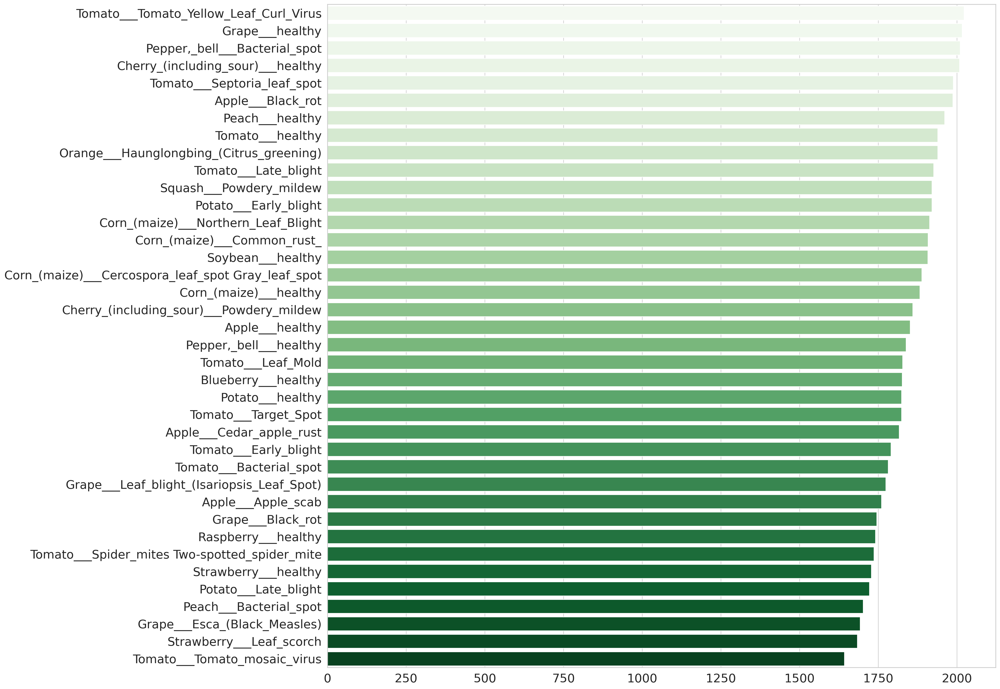

In [11]:
plant_names = []
Len = []
for i in Diseases_classes:
    plant_names.append(i)
    imgs_path = os.listdir(train_dir + "/" + i)
    Len.append(len(imgs_path))

Len.sort(reverse=True)

sns.set(style="whitegrid", color_codes=True)
plt.figure(figsize=(20,20),dpi=200)
ax = sns.barplot(x= Len, y= plant_names, palette="Greens")
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.show()

# Define utility functions and a wrapper class to automatically move data and models to the available device (CPU/GPU).


In [12]:
def get_default_device():
    return torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

def to_device(data, device):
    if isinstance(data, (list, tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader:
    def __init__(self, dataloader, device):
        self.dataloader = dataloader
        self.device = device

    def __iter__(self):
        for b in self.dataloader:
            yield to_device(b, self.device)

    def __len__(self):
        return len(self.dataloader)

device = get_default_device()
train_dataloader = DeviceDataLoader(trainloader, device)
valid_dataloader = DeviceDataLoader(validloader, device)


In [13]:
# Display the current computing device being used (CPU or GPU).
device = get_default_device()
device

device(type='cuda')

## Define a helper function to calculate classification accuracy.

In [14]:
# for calculating the accuracy
def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))

#  Base class for image classification models.
# Includes training and validation steps and performance summarization.


<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**Classification Base:**


   - Let's create a step by step classification base module:
    
   - **First, Training_step:** the images and labels take values from batch. The output of model is a type of images and the loss is calculate from **F** cross entropy function (out, labels). It seems that the prediction is compared with the actual values in labels.
    
   - **Second, validation step:** is just like the above one. But it has another attribute call acc.
    
   - **Third, validation_epoch_end:** calculate the losses and acces of each batchs and epochs.
    
   - **Fourth, epoch_end:** That shows the final results of everything.
    
    

In [15]:
class ImageClassificationBase(nn.Module):

    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                    # Generate predictions
        loss = F.cross_entropy(out, labels)   # Calculate loss
        acc = accuracy(out, labels)           # Calculate accuracy
        return {'val_loss': loss.detach(), 'val_acc': acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        batch_accs = [x['val_acc'] for x in outputs]
        epoch_acc = torch.stack(batch_accs).mean()      # Combine accuracies
        return {'val_loss': epoch_loss.item(), 'val_acc': epoch_acc.item()}

    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss'], result['val_acc']))

## Define a reusable convolutional block with optional max pooling.

In [16]:
# convolution block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)

#  Define the custom CNN model architecture with residual connections.



<div style = 'border : 3px solid non; background-color:#ECFFDC ; ;padding:10px'>


**CNN:**


   - And the CNN part
    
   - We can use the class of **ImageClassificationBase** for taking methods like calculating the loss and acc of epochs. And after that, we can set our layers. We can use more layers but in this case, the size of images don't allow to do that **Going to be zero**. In the second part, we have to connect layers to each other. The output of layer number **N**, is the input of layer number **N+1**. And so on.

In [23]:
# resnet architecture
class CNN_NeuralNet(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()

        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True)
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))

        self.conv3 = ConvBlock(128, 256, pool=True)
        self.conv4 = ConvBlock(256, 512, pool=True)
        #self.conv5 = ConvBlock(256, 256, pool=True)
        #self.conv6 = ConvBlock(256, 512, pool=True)
        #self.conv7 = ConvBlock(512, 512, pool=True)

        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))
        self.classifier = nn.Sequential(nn.AdaptiveAvgPool2d((1, 1)),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases))

    def forward(self, x): # x is the loaded batch
        out = self.conv1(x)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        #out = self.conv5(out)
        #out = self.conv6(out)
        #out = self.conv7(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out

# Send the model to the appropriate device (GPU or CPU).


In [27]:
model = to_device(CNN_NeuralNet(3, len(trainset.classes)), device)

## Evaluate model performance on validation data.

In [28]:
# for training
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

## Helper function to retrieve the current learning rate from the optimizer.

In [29]:
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']

### OneCycle training loop with learning rate scheduling, weight decay, and optional gradient clipping.

In [30]:
def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader,
                 weight_decay=0, grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []

    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr,
                                                epochs=epochs, steps_per_epoch=len(train_loader))

    for epoch in range(epochs):
        torch.cuda.empty_cache()
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()

            if grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)

            optimizer.step()
            optimizer.zero_grad()
            lrs.append(get_lr(optimizer))
            sched.step()

        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)
    return history


# Set training hyperparameters and train the model.

In [31]:
num_epochs = 5
lr = 0.01
grad_clip = 0.1
weight_decay = 1e-4
optimizer_function = torch.optim.Adam

history = [evaluate(model, valid_dataloader)]
history += fit_OneCycle(num_epochs, lr, model, train_dataloader, valid_dataloader,
                        grad_clip=grad_clip,
                        weight_decay=weight_decay,
                        opt_func=optimizer_function)

Epoch [0], train_loss: 0.7647, val_loss: 0.7165, val_acc: 0.7834
Epoch [1], train_loss: 0.4711, val_loss: 1.7273, val_acc: 0.6075
Epoch [2], train_loss: 0.2871, val_loss: 0.2821, val_acc: 0.9132
Epoch [3], train_loss: 0.1504, val_loss: 0.0671, val_acc: 0.9787
Epoch [4], train_loss: 0.0537, val_loss: 0.0343, val_acc: 0.9896


# Plot training vs validation loss and validation accuracy.


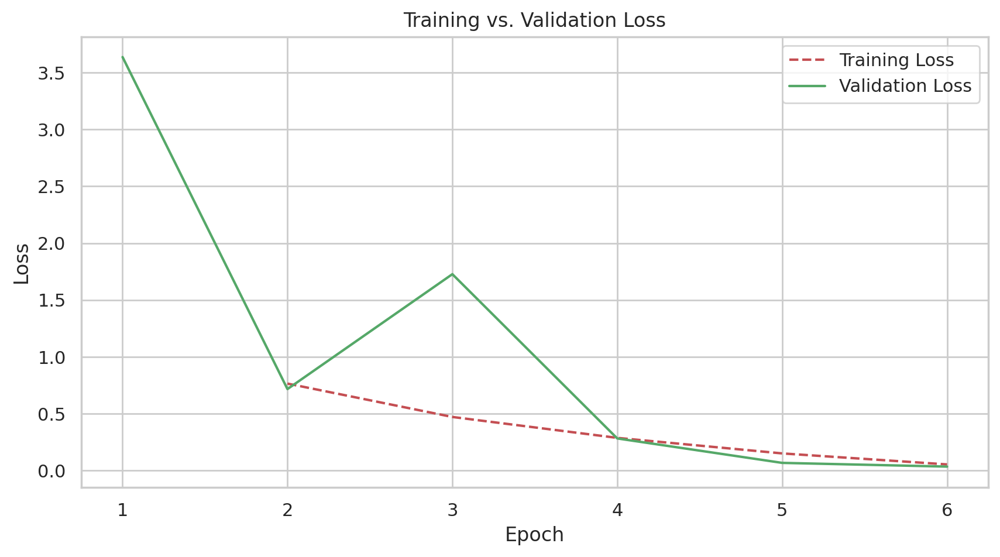

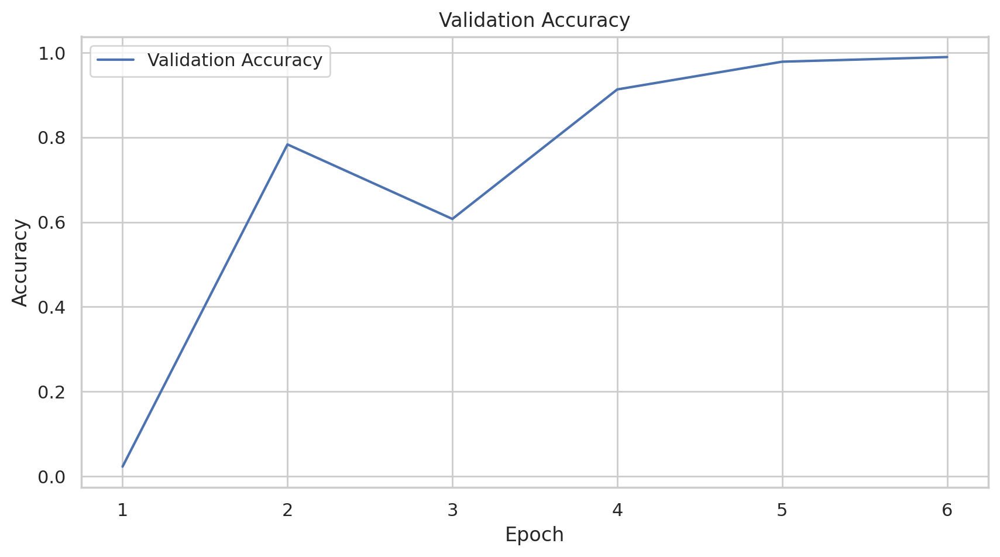

In [32]:
val_acc = [x['val_acc'] for x in history]
val_loss = [x['val_loss'] for x in history]
train_loss = [x.get('train_loss') for x in history]

epoch_count = range(1, len(history) + 1)

plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, train_loss, 'r--', label='Training Loss')
plt.plot(epoch_count, val_loss, 'g-', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs. Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5), dpi=200)
plt.plot(epoch_count, val_acc, 'b-', label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Validation Accuracy')
plt.legend()
plt.grid(True)
plt.show()


## Predict class label for a single image.

In [33]:
@torch.no_grad()
def predict_image(img, model):
    xb = to_device(img.unsqueeze(0), device)
    yb = model(xb)
    _, preds = torch.max(yb, dim=1)
    return trainset.classes[preds[0].item()]

## Show a few test images with their predicted labels.

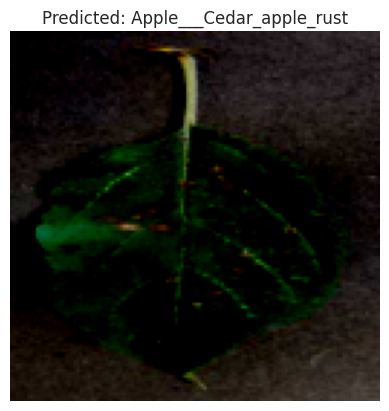

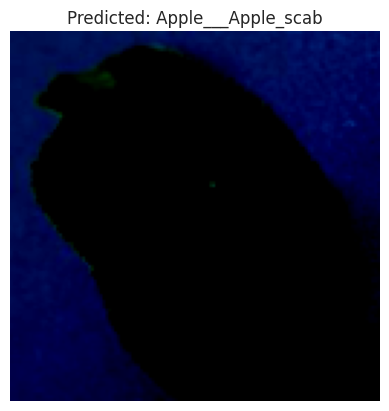

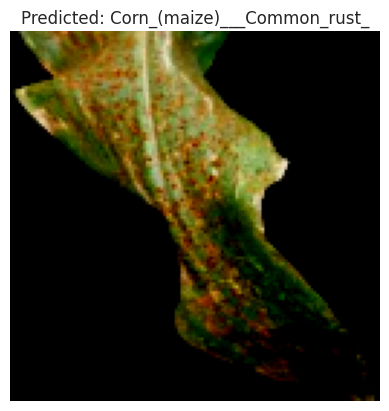

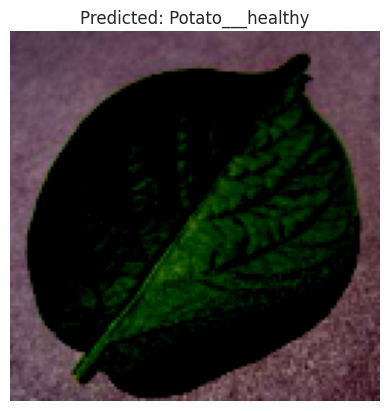

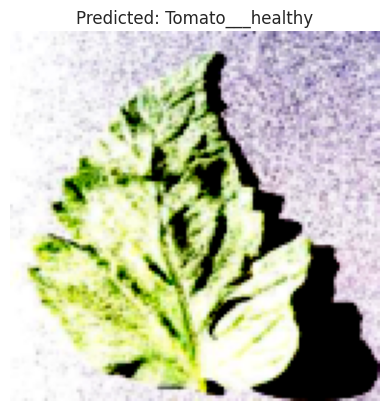

In [34]:
test = ImageFolder(test_dir, transform=transform)

indices = [1, 5, 9, 16, 26]
for idx in indices:
    img, label = test[idx]
    plt.imshow(img.permute(1, 2, 0))
    plt.axis('off')
    plt.title(f"Predicted: {predict_image(img, model)}")
    plt.show()

### Predict all test images and print their predicted labels.

In [35]:
for i, (img, label) in enumerate(test):
    predicted_label = predict_image(img, model)
    print(Fore.GREEN + f"Image {i}: Predicted → {predicted_label}")

Image 0: Predicted → Apple___Cedar_apple_rust
Image 1: Predicted → Apple___Cedar_apple_rust
Image 2: Predicted → Apple___Cedar_apple_rust
Image 3: Predicted → Apple___Cedar_apple_rust
Image 4: Predicted → Apple___Apple_scab
Image 5: Predicted → Apple___Apple_scab
Image 6: Predicted → Apple___Apple_scab
Image 7: Predicted → Corn_(maize)___Common_rust_
Image 8: Predicted → Corn_(maize)___Common_rust_
Image 9: Predicted → Corn_(maize)___Common_rust_
Image 10: Predicted → Potato___Early_blight
Image 11: Predicted → Potato___Early_blight
Image 12: Predicted → Potato___Early_blight
Image 13: Predicted → Potato___Early_blight
Image 14: Predicted → Potato___Early_blight
Image 15: Predicted → Potato___healthy
Image 16: Predicted → Potato___healthy
Image 17: Predicted → Tomato___Late_blight
Image 18: Predicted → Tomato___Late_blight
Image 19: Predicted → Tomato___Early_blight
Image 20: Predicted → Tomato___Early_blight
Image 21: Predicted → Tomato___Early_blight
Image 22: Predicted → Tomato___Ea

## Save the trained model to a file.

In [36]:
model_path = 'plant_disease_model.pth'
torch.save(model.state_dict(), model_path)
print("Model saved to:", model_path)


Model saved to: plant_disease_model.pth


## Load the saved model weights for inference.

In [37]:
model = to_device(CNN_NeuralNet(3, len(trainset.classes)), device)
model.load_state_dict(torch.load('plant_disease_model.pth', map_location=device))
model.eval()
print("Model loaded and ready for prediction.")


Model loaded and ready for prediction.


### Convert the trained model to TorchScript format and save it.

In [38]:
example_input = torch.rand(1, 3, 128, 128).to(device)
traced_model = torch.jit.trace(model, example_input)
traced_model.save("plant_disease_model.pt")
print("TorchScript model saved to: plant_disease_model.pt")


TorchScript model saved to: plant_disease_model.pt


#Thank You Message & Learning Advice
Dear Students,
Thank you for exploring this plant disease detection model. This project is the result of dedicated effort and continuous learning in the fields of deep learning and computer vision. It was designed not only to detect plant diseases accurately but also to serve as an educational tool for those who wish to understand how AI can be applied in real-world agricultural problems.

Learning Advice:
Don’t just use the model—learn from it. Dive into each block of code, understand the logic behind every function, and experiment with different architectures and datasets.
Remember: "You don’t learn to code by copying, you learn to code by understanding, breaking, and rebuilding."

🌱 Whether you're a beginner or an aspiring AI engineer, let this model be a stepping stone to greater projects. Never stop asking why, and always stay curious.

Wishing you the best in your learning journey,
**Abdulrahman Hamdi**